In [102]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

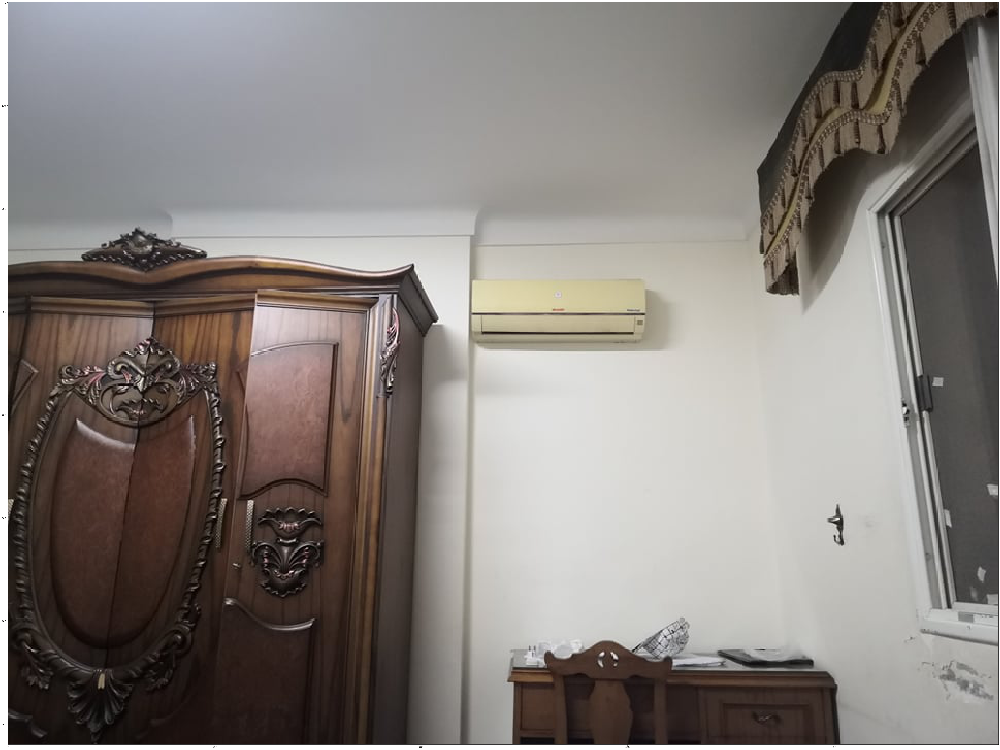

In [103]:
def show(img, size=75):
    plt.figure(figsize = (size,size))
    
    if len(img.shape) == 2: # if grayscale, set cmap
        plt.imshow(img, cmap="gray", vmin=0, vmax=255)
    else: # if 3 channels, change from BGR to RGB
        plt.imshow(img[...,::-1])
        
    plt.show()

img = cv2.imread("./image_mosaics_1.jpg")
show(img)

## Finding The KeyPoints Using SIFT

In [104]:
def get_keypoints(img):
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img,None)
    img_keypoints=cv2.drawKeypoints(img,kp,img)
#     show(img_keypoints, 8)
    return kp, des

## Finding Correspondence

In [105]:
# Return correspondences in the following format:
# [
#  pos in imgA, pos in imgB
#  [(x,y), (x,y)], # match 1
#  [(x,y), (x,y)] # match 2
#  ...
# ]

def get_correspondences(imgA, imgB):
    kp1, des1 = get_keypoints(imgA)
    kp2, des2 = get_keypoints(imgB)

    
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    
    # des1 = queryDescriptor, des2 = trainDescriptor
    matches = bf.knnMatch(des1,des2,k=2)
    
    # Apply ratio test
    good = []
    final_matches = []
    for m,n in matches:
        if m.distance < 0.235*n.distance:
            good.append([m])
            final_matches.append([kp1[m.queryIdx].pt, kp2[m.trainIdx].pt])
            
            
    # cv.drawMatchesKnn expects list of lists as matches.
    img3 = cv2.drawMatchesKnn(imgA,kp1,imgB,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    show(img3)
    print(f"found {len(good)} matches")
    
    return final_matches

## Construct Homography Matrix

In [106]:
def construct_homography_matrix(matches):
    A = [];
    
    for match in matches:
        xi = match[0][0]
        yi = match[0][1]
        
        xj = match[1][0]
        yj = match[1][1]
        
        A.append([xi, yi, 1, 0, 0, 0, -1*xj*xi, -1*xj*yi, -1*xj])
        A.append([0, 0, 0, xi, yi, 1, -1*yj*xi, -1*yj*yi, -1*yj])
        
    print(A)
    
    u, s, vh = np.linalg.svd(A, full_matrices=True)
    h = vh[-1]
    return np.array(h).reshape((3,3))

construct_homography_matrix([
    [(0,0), (0,0)],
    [(0,1), (0.5,1)],
    [(1,0), (2,0)],
    [(1,1), (1.5,1)],
])

[[0, 0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0, 0], [0, 1, 1, 0, 0, 0, -0.0, -0.5, -0.5], [0, 0, 0, 0, 1, 1, 0, -1, -1], [1, 0, 1, 0, 0, 0, -2, 0, -2], [0, 0, 0, 1, 0, 1, 0, 0, 0], [1, 1, 1, 0, 0, 0, -1.5, -1.5, -1.5], [0, 0, 0, 1, 1, 1, -1, -1, -1]]


array([[ 6.03022689e-01,  3.01511345e-01,  0.00000000e+00],
       [ 2.03042581e-16,  6.03022689e-01,  1.05969190e-17],
       [-6.46591136e-17,  3.01511345e-01,  3.01511345e-01]])

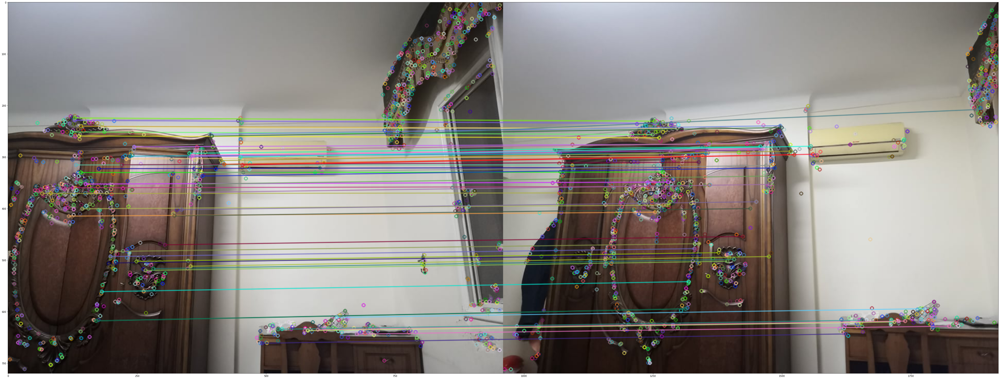

found 54 matches
[[66.22498321533203, 370.88128662109375, 1, 0, 0, 0, -16402.5467689964, -91859.55743873492, -247.67913818359375], [0, 0, 0, 66.22498321533203, 370.88128662109375, 1, -24464.579539370956, -137009.54376543127, -369.4161682128906], [107.5010757446289, 359.5982666015625, 1, 0, 0, 0, -30342.76586929499, -101498.57510649785, -282.2554626464844], [0, 0, 0, 107.5010757446289, 359.5982666015625, 1, -38395.570146159036, -128435.74237839505, -357.1645202636719], [117.83856201171875, 414.5398254394531, 1, 0, 0, 0, -34639.28325991519, -121856.2259312449, -293.9554138183594], [0, 0, 0, 117.83856201171875, 414.5398254394531, 1, -47966.17443996854, -168738.39293257426, -407.0498962402344], [123.35974884033203, 251.26173400878906, 1, 0, 0, 0, -35700.935491832206, -72716.41715989681, -289.4050598144531], [0, 0, 0, 123.35974884033203, 251.26173400878906, 1, -31622.643673138227, -64409.666507500224, -256.34490966796875], [129.19346618652344, 228.85340881347656, 1, 0, 0, 0, -37864.46879974

In [110]:
imgA = cv2.imread("./image_mosaics_1.jpg")
imgB = cv2.imread("./image_mosaics_2.jpg")


correspondences = get_correspondences(imgA, imgB)
H = construct_homography_matrix(correspondences)

### Test Homography Matrix

(107.5010757446289, 359.5982666015625)
[[107.50107574]
 [359.5982666 ]
 [  1.        ]]
[[107.50107574]
 [359.5982666 ]
 [  1.        ]]
[[282.6792455 ]
 [357.33231448]
 [  1.        ]]
(282.2554626464844, 357.1645202636719)


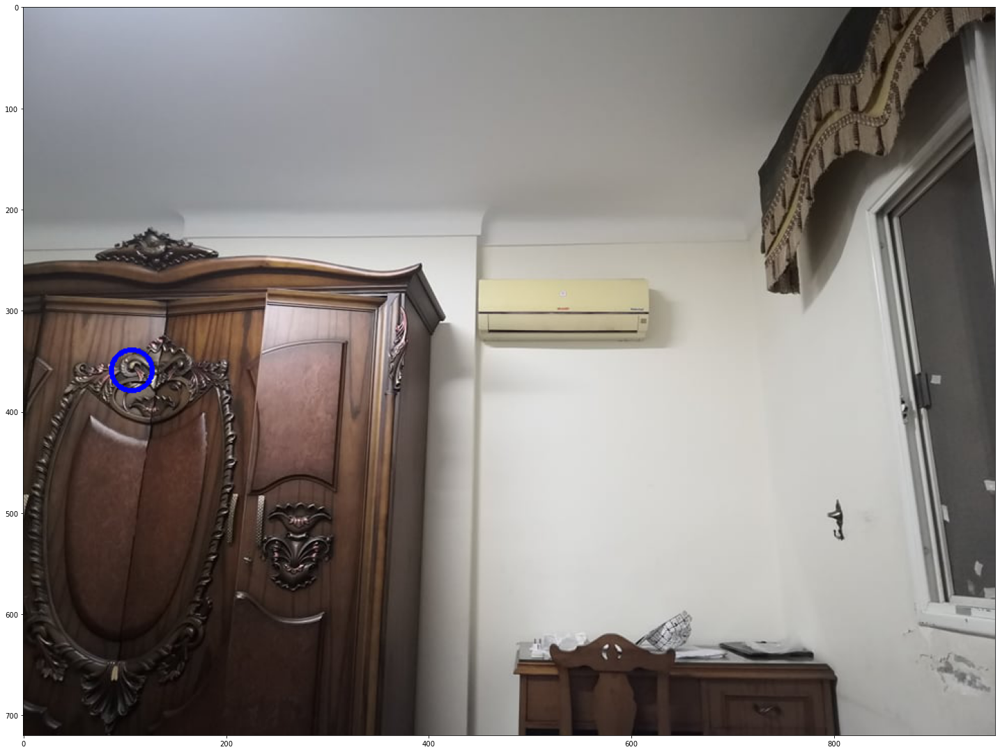

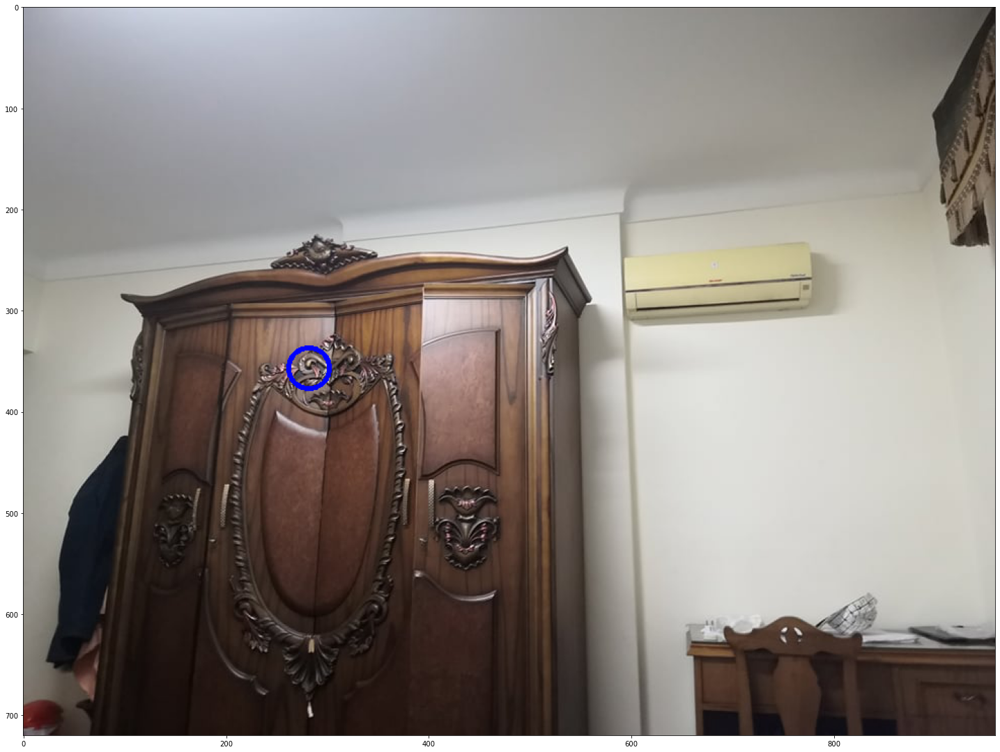

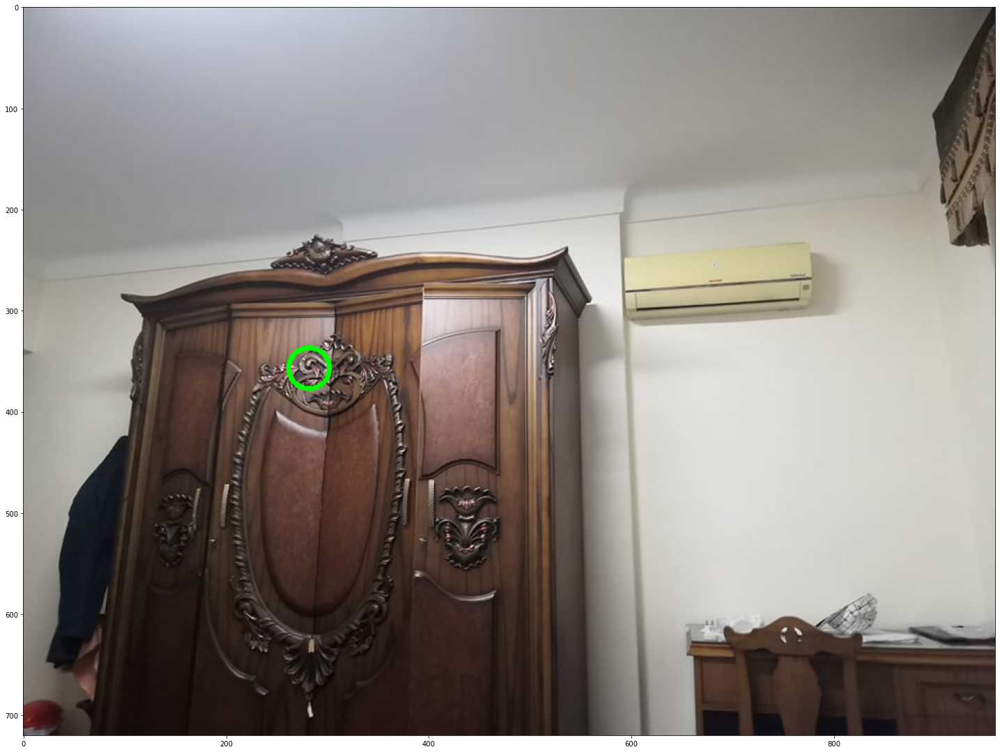

In [108]:
imgA = cv2.imread("./image_mosaics_1.jpg")
imgB = cv2.imread("./image_mosaics_2.jpg")

pointA = correspondences[1][0]
pointB = correspondences[1][1]


pointAHomogenousCoord = np.array([pointA[0], pointA[1], 1]).reshape((3,1))

print(pointA)
print(pointAHomogenousCoord)

pointA_ = np.matmul(H, pointAHomogenousCoord)
pointA_ /= pointA_[2][0]

print(pointAHomogenousCoord)
print(pointA_)
print(pointB)

imgA = cv2.circle(imgA, (int(pointA[0]), int(pointA[1])), 20, (255,0,0), 4)
show(imgA, 25)

imgB = cv2.circle(imgB, (int(pointB[0]), int(pointB[1])), 20, (255,0,0), 4)
show(imgB, 25)

# imgB = cv2.imread("./image_mosaics_2.jpg")
imgB = cv2.circle(imgB, (int(pointA_[0][0]), int(pointA_[1][0])), 20, (0,255,0), 4)
show(imgB, 25)

## Forward Warp

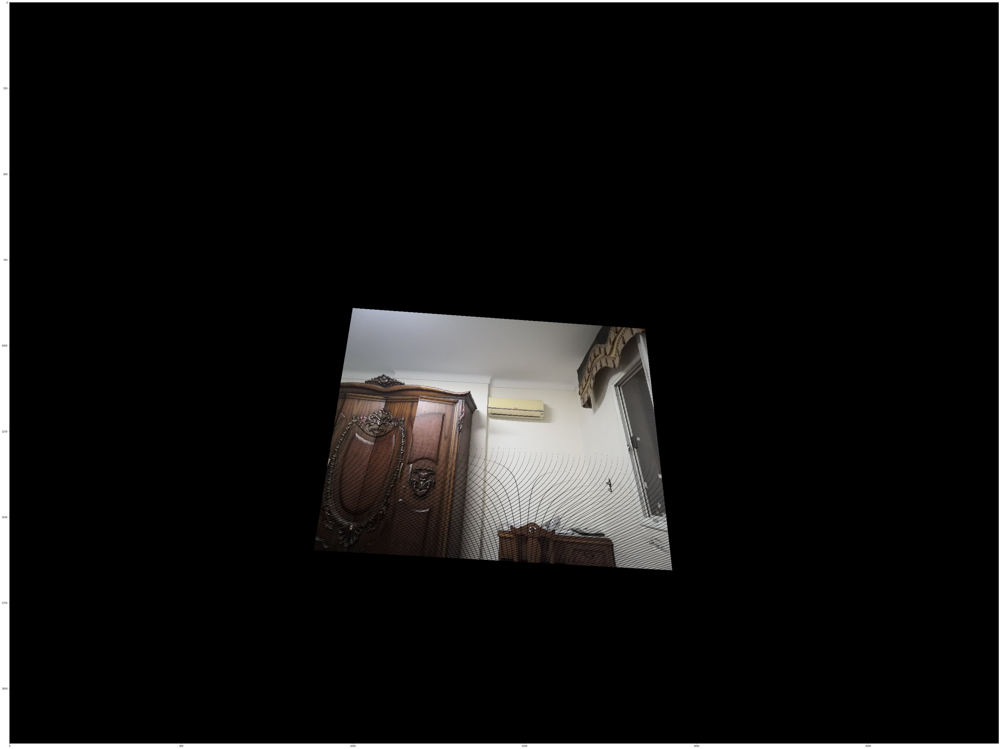

In [137]:
imgA = cv2.imread("./image_mosaics_1.jpg")
imgB = cv2.imread("./image_mosaics_2.jpg")


def warp(img, H):
    (height, width, depth) = img.shape
    
    height_offset = int(height)
    width_offset = int(width)
    final_img = np.zeros([height*3, width*3, depth])
    

    for i in range(height):
        for j in range(width):
            source = np.array([i,j,1]).reshape((3,1))
            
            destination = np.matmul(H, source)
            destination /= destination[2][0]
            destination = destination.astype(int)

            final_img[destination[0][0]+height_offset][destination[1][0]+width_offset] = img[i][j]
    
    return final_img.astype(int)
    
show(warp(imgA, H))